# Import Libraries

In [1]:
from aquacrop import AquaCropModel, Soil, Crop, InitialWaterContent, GroundWater, IrrigationManagement
from aquacrop.utils import prepare_weather, get_filepath
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pathlib
from pathlib import Path
import geopandas as gpd
from sqlalchemy import create_engine
from sqlalchemy import inspect
import pyodbc

from owslib.wcs import WebCoverageService

import xarray as xr

import rasterio
from rasterio.plot import show

from matplotlib import pyplot

import numpy as np

import glob as glob

import rioxarray

from pathlib import Path

import elevation

import cdsapi
import zipfile
import rioxarray as rio 
from tqdm import tqdm
from datetime import datetime as dt
import datetime
import schedule
import netCDF4 as nc
from netCDF4 import Dataset
import os, sys
import copy
import platform
import tempfile
import logging
from math import log10, cos, sin, asin, sqrt, exp, pi, radians
from collections import namedtuple
from bisect import bisect_left
import textwrap
import sqlite3
from collections import Iterable
from osgeo import gdal

from altitudo import altitudo

import traceback

from datetime import date, timedelta

import plotly.express as px

/tmp/ipykernel_3234/72943008.py:52: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  from collections import Iterable


# Define Directories

In [2]:
DataDir = '/home/c4ubuntu/projDir/SADC/Data/'

# Import results

In [4]:
os.listdir(os.path.join(DataDir,'GIS','AgroEcoZones'))

['.ipynb_checkpoints',
 'africa_agroecological_zoning.shx',
 'africa_agroecological_zoning.prj',
 'africa_agroecological_zoning.cst',
 'africa_agroecological_zoning.shp',
 'africa_agroecological_zoning.dbf']

In [18]:
zmb = gpd.read_file(os.path.join(DataDir,'GIS','GADM','gadm41_ZMB_0.shp'))
lso = gpd.read_file(os.path.join(DataDir,'GIS','GADM','gadm41_LSO_0.shp'))
mdg = gpd.read_file(os.path.join(DataDir,'GIS','GADM','gadm41_MDG_0.shp'))
mwi = gpd.read_file(os.path.join(DataDir,'GIS','GADM','gadm41_MWI_0.shp'))
swz = gpd.read_file(os.path.join(DataDir,'GIS','GADM','gadm41_SWZ_0.shp'))

boundaries = gpd.GeoDataFrame(pd.concat([zmb,lso,mdg,mwi,swz], ignore_index=True) )

boundaries.loc[boundaries['COUNTRY']=='Swaziland', 'COUNTRY'] = 'eSwatini'

boundaries = boundaries.to_crs(epsg=4326)

agro_ecozone = gpd.read_file(os.path.join(DataDir,'GIS','AgroEcoZones','africa_agroecological_zoning.shp'))

agro_ecozones = agro_ecozone.clip(boundaries)

<AxesSubplot: >

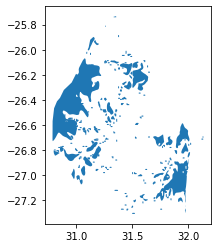

In [17]:
agro_ecozones.clip(boundaries.loc[boundaries['COUNTRY']=='eSwatini']).plot()

In [4]:
os.listdir(os.path.join(DataDir,'Output','CSVs'))

['.ipynb_checkpoints',
 'SADC_Baseline_Phase1_SoilNames_2023-01-10 09:23:21.854064.csv',
 'SADC_Baseline_Phase1_Zambia_2023-01-16 18:49:15.730879.csv',
 'SADC_Baseline_Phase1_2023-01-16 18:59:58.044524.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:01:35.375264.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:02:37.313149.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:03:16.963207.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:03:45.133466.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:07:55.843661.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:15:00.098062.csv',
 'SADC_Baseline_Phase1_2023-01-17 04:56:06.549377.csv',
 'SADC_Baseline_Phase1_SoilNames_2023-01-23.csv',
 'SADC_Baseline_Phase1_WaterFlux_2023-01-23.csv',
 'SADC_Baseline_Phase1_WaterStorage_2023-01-23.csv',
 'SADC_Baseline_Phase1_CropGrowth_2023-01-23.csv',
 'SADC_Baseline_Phase1_Yields_2023-01-23.csv',
 'Calibration']

### Default with soil name and planting dates

In [20]:
test = pd.read_csv(os.path.join(DataDir,'Output','CSVs','SADC_Baseline_Phase1_Yields_2023-01-23.csv'))

test['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(test['Harvest Date (YYYY/MM/DD)'])

test['Year'] = test['Harvest Date (YYYY/MM/DD)'].dt.year

In [21]:
test.Country.unique()

array(['eSwatini'], dtype=object)

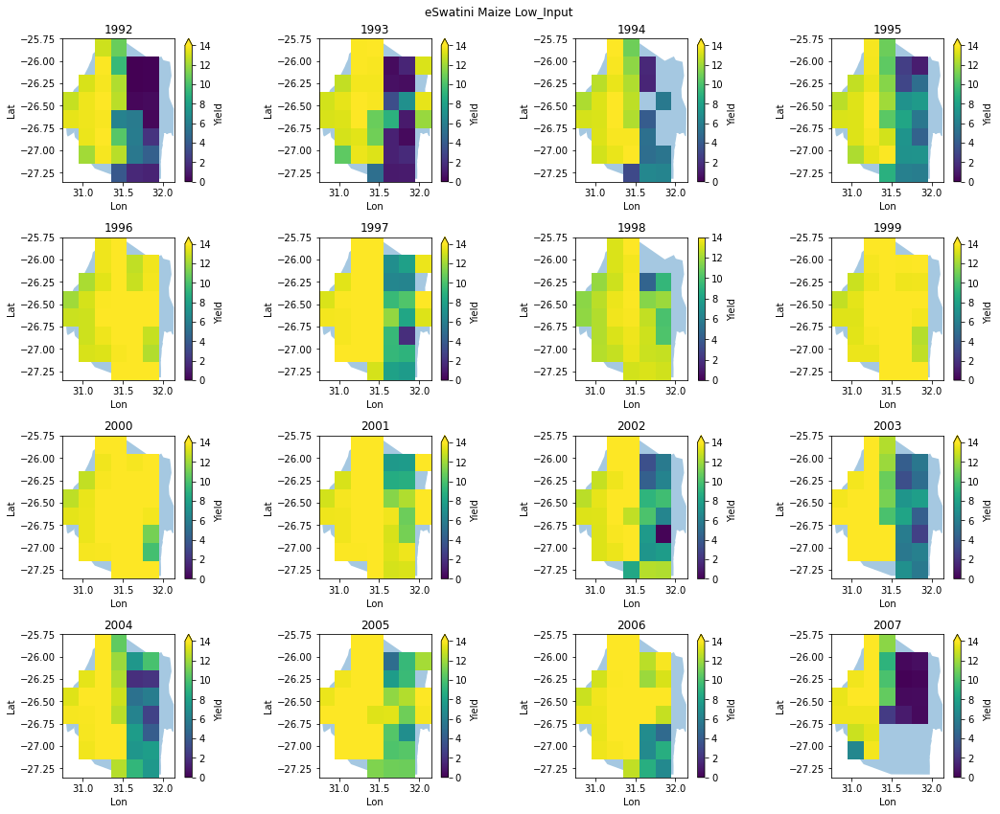

In [10]:
years = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15']

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)


for country in test.Country.unique():
    bound = boundaries.loc[boundaries['COUNTRY']==country]
    for scene in test.Scenario.unique():
        for crop in test['crop Type'].unique():
            dftmp = test.loc[(test['Country']==country)&(test['Scenario']==scene)&(test['crop Type']==crop)]
            dftmp = dftmp.groupby(['Lat','Lon','Year','Country','Scenario','crop Type']).mean()
            dftmp = dftmp[['Yield (tonne/ha)']].to_xarray()
            dftmp = dftmp.rename_vars({'Yield (tonne/ha)':'Yield'})
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                bound.plot(ax=ax, alpha=0.4)
                dftmp.Yield[:,:,int(year),:,:].plot(ax=ax,  vmin=0, vmax=14)
                ax.set_title(int(dftmp.Yield[:,:,int(year),:,:].Year.data))
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            #plt.savefig(os.path.join(DataDir,'Output','Figures','Phase1_{}_{}_{}.png'.format(country, crop, scene)))

In [22]:
Yields_gdf = gpd.GeoDataFrame(test, geometry=gpd.points_from_xy(test.Lon, test.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

watersheds = gpd.read_file(os.path.join(DataDir,'GIS','combined_wsheds.shp'))
watersheds = watersheds.to_crs(epsg=4326)

watershed_yield = Yields_gdf.sjoin(watersheds, how='left', predicate='within')
watershed_yield['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(watershed_yield['Harvest Date (YYYY/MM/DD)'])

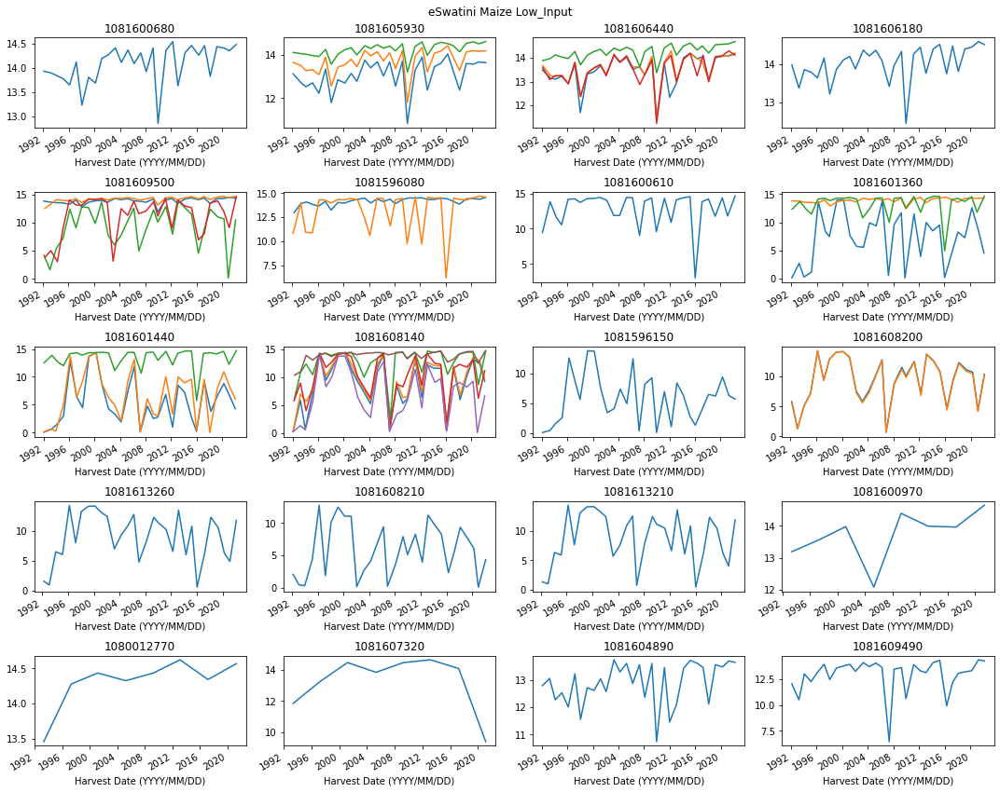

In [66]:
years = watershed_yield.HYBAS_ID.unique()

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)


for country in watershed_yield.Country.unique():
    for scene in watershed_yield.Scenario.unique():
        for crop in watershed_yield['crop Type'].unique():
            dftmp = watershed_yield.loc[(watershed_yield['Country']==country)&(watershed_yield['Scenario']==scene)&(watershed_yield['crop Type']==crop)]
            #dftmp.set_index('Harvest Date (YYYY/MM/DD)', inplace=True)
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                dftmp.loc[dftmp['HYBAS_ID']==year].set_index('Harvest Date (YYYY/MM/DD)').groupby('N_ID')['Yield (tonne/ha)'].plot(ax=ax)
                ax.set_title(year)
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            #plt.savefig(os.path.join(DataDir,'Output','Figures','Phase1_{}_{}_{}.png'.format(country, crop, scene)))

### Planting Dates

In [107]:
watershed_yield['plant_date'] = pd.to_datetime(watershed_yield['plant_date'])

watershed_yield['DOY'] = watershed_yield.plant_date.dt.day_of_year

watershed_yield['year'] = watershed_yield.plant_date.dt.year

In [108]:
for id in watershed_yield.HYBAS_ID.unique():
    dftmp = watershed_yield.loc[watershed_yield['HYBAS_ID']==id]
    fig = px.scatter(dftmp, x=dftmp['DOY'], y=dftmp['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66), title='Watershed {}'.format(id))
    fig.show()
    #fig.write_image(os.path.join(DataDir,'Output','Figures','Indicators','{}_PlantingDateDist.png'.format(id)))

### Agro Ecological Zones

In [129]:
Yields_gdf = gpd.GeoDataFrame(test, geometry=gpd.points_from_xy(test.Lon, test.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

ecozone_yield = Yields_gdf.sjoin(agro_ecozone, how='left', predicate='within')
ecozone_yield['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(ecozone_yield['Harvest Date (YYYY/MM/DD)'])

In [130]:
ecozone_yield.AEZ_NAME.unique()

array([nan, 'Subtropic - warm / semiarid', 'Tropic - cool / subhumid'],
      dtype=object)

In [131]:
ecozone_yield['plant_date'] = pd.to_datetime(ecozone_yield['plant_date'])

ecozone_yield['DOY'] = ecozone_yield.plant_date.dt.day_of_year

ecozone_yield['year'] = ecozone_yield.plant_date.dt.year

In [133]:
for i in ['Subtropic - warm / semiarid', 'Tropic - cool / subhumid']:
    dftmp = ecozone_yield.loc[ecozone_yield['AEZ_NAME']==i]
    fig = px.scatter(dftmp, x=dftmp['DOY'], y=dftmp['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66), title='EcoZone {}'.format(i))
    fig.show()
    #fig.write_image(os.path.join(DataDir,'Output','Figures','Indicators','{}_PlantingDateDist.png'.format(id)))

### Custom Soil Profile, REW, 100 Penetrability

In [82]:
df1 = pd.read_csv(os.path.join(DataDir,'Output','CSVs','Calibration','eSwatini_Baseline_Phase1_Yields_Maize_100Pen_2023-01-30 22:39:14.481831.csv'))
df1['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(df1['Harvest Date (YYYY/MM/DD)'])
df1['Year'] = df1['Harvest Date (YYYY/MM/DD)'].dt.year

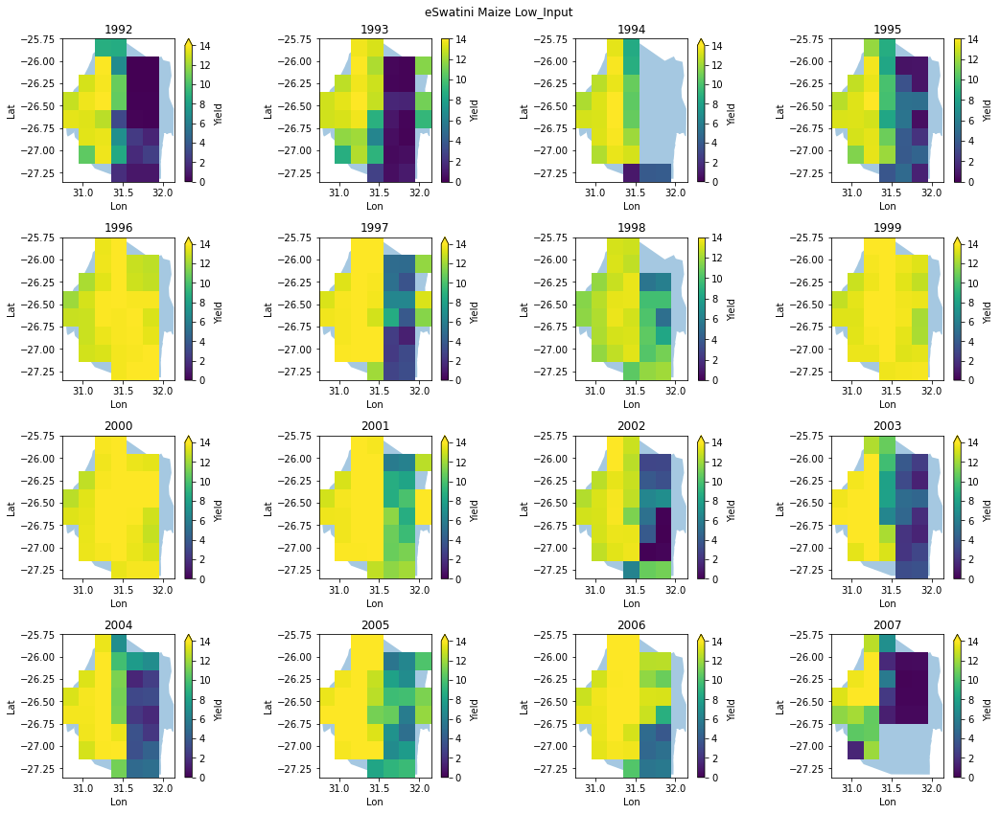

In [83]:
years = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15']

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)


for country in df1.Country.unique():
    bound = boundaries.loc[boundaries['COUNTRY']==country]
    for scene in df1.Scenario.unique():
        for crop in df1['crop Type'].unique():
            dftmp = df1.loc[(df1['Country']==country)&(df1['Scenario']==scene)&(df1['crop Type']==crop)]
            dftmp = dftmp.groupby(['Lat','Lon','Year','Country','Scenario','crop Type']).mean()
            dftmp = dftmp[['Yield (tonne/ha)']].to_xarray()
            dftmp = dftmp.rename_vars({'Yield (tonne/ha)':'Yield'})
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                bound.plot(ax=ax, alpha=0.4)
                dftmp.Yield[:,:,int(year),:,:].plot(ax=ax, vmin=0, vmax=14)
                ax.set_title(int(dftmp.Yield[:,:,int(year),:,:].Year.data))
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            #plt.savefig(os.path.join(DataDir,'Output','Figures','Phase1_{}_{}_{}.png'.format(country, crop, scene)))

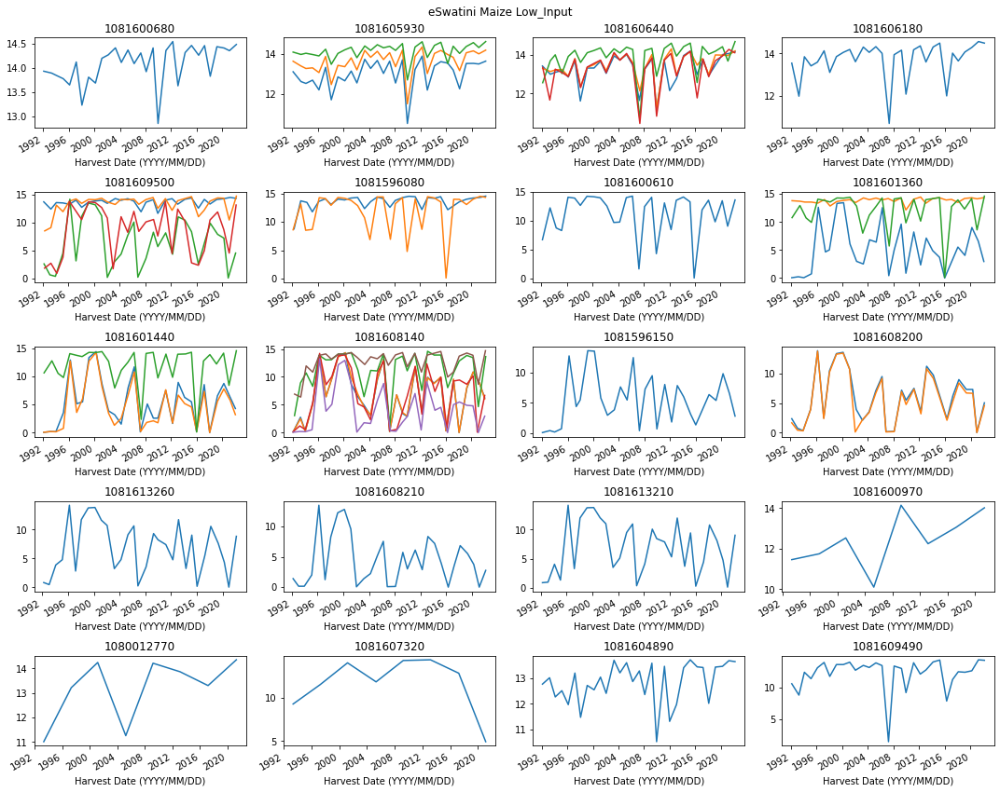

In [84]:
Yields_gdf = gpd.GeoDataFrame(df1, geometry=gpd.points_from_xy(df1.Lon, df1.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

watersheds = gpd.read_file(os.path.join(DataDir,'GIS','combined_wsheds.shp'))
watersheds = watersheds.to_crs(epsg=4326)

watershed_yield = Yields_gdf.sjoin(watersheds, how='left', predicate='within')
watershed_yield['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(watershed_yield['Harvest Date (YYYY/MM/DD)'])

years = watershed_yield.HYBAS_ID.unique()

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)


for country in watershed_yield.Country.unique():
    for scene in watershed_yield.Scenario.unique():
        for crop in watershed_yield['crop Type'].unique():
            dftmp = watershed_yield.loc[(watershed_yield['Country']==country)&(watershed_yield['Scenario']==scene)&(watershed_yield['crop Type']==crop)]
            #dftmp.set_index('Harvest Date (YYYY/MM/DD)', inplace=True)
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                dftmp.loc[dftmp['HYBAS_ID']==year].set_index('Harvest Date (YYYY/MM/DD)').groupby('N_ID')['Yield (tonne/ha)'].plot(ax=ax)
                ax.set_title(year)
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            #plt.savefig(os.path.join(DataDir,'Output','Figures','Phase1_{}_{}_{}.png'.format(country, crop, scene)))

In [134]:
Yields_gdf = gpd.GeoDataFrame(df1, geometry=gpd.points_from_xy(df1.Lon, df1.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

ecozone_yield = Yields_gdf.sjoin(agro_ecozone, how='left', predicate='within')
ecozone_yield['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(ecozone_yield['Harvest Date (YYYY/MM/DD)'])

ecozone_yield.AEZ_NAME.unique()

ecozone_yield['plant_date'] = pd.to_datetime(ecozone_yield['plant_date'])

ecozone_yield['DOY'] = ecozone_yield.plant_date.dt.day_of_year

ecozone_yield['year'] = ecozone_yield.plant_date.dt.year

for i in ['Subtropic - warm / semiarid', 'Tropic - cool / subhumid']:
    dftmp = ecozone_yield.loc[ecozone_yield['AEZ_NAME']==i]
    fig = px.scatter(dftmp, x=dftmp['DOY'], y=dftmp['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66), title='EcoZone {}'.format(i))
    fig.show()
    #fig.write_image(os.path.join(DataDir,'Output','Figures','Indicators','{}_PlantingDateDist.png'.format(id)))

### Custom Soil Profile, REW, 50 Penetrability

In [74]:
os.listdir(os.path.join(DataDir,'Output/CSVs/Calibration/'))

['Baseline_Phase1_WaterFlux_2023-01-23 14:21:53.100638.csv',
 'Baseline_Phase1_WaterStorage_2023-01-23 14:21:56.634353.csv',
 'Baseline_Phase1_CropGrowth_2023-01-23 14:22:00.743054.csv',
 '.ipynb_checkpoints',
 'Baseline_Phase1_Yields_2023-01-23 14:22:03.972159.csv',
 'Baseline_Phase1_WaterFlux_2023-01-23 15:09:43.995377.csv',
 'Baseline_Phase1_WaterStorage_2023-01-23 15:09:47.522129.csv',
 'Baseline_Phase1_CropGrowth_2023-01-23 15:09:51.317061.csv',
 'Baseline_Phase1_Yields_2023-01-23 15:09:54.337923.csv',
 'Baseline_Phase1_WaterFlux_2023-01-23 15:26:46.856716.csv',
 'Baseline_Phase1_WaterStorage_2023-01-23 15:26:50.281114.csv',
 'Baseline_Phase1_CropGrowth_2023-01-23 15:26:54.234105.csv',
 'Baseline_Phase1_Yields_2023-01-23 15:26:57.471394.csv',
 'eSwatini_Baseline_Phase1_WaterFlux_2023-01-29 16:21:37.172939.csv',
 'eSwatini_Baseline_Phase1_WaterStorage_2023-01-29 16:21:41.956736.csv',
 'eSwatini_Baseline_Phase1_CropGrowth_2023-01-29 16:21:47.028585.csv',
 'eSwatini_Baseline_Phase1_Y

In [85]:
df2 = pd.read_csv(os.path.join(DataDir,'Output','CSVs','Calibration','eSwatini_Baseline_Phase1_Yields_Maize_50Pen_2023-01-30 22:52:49.842608.csv'))
df2['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(df2['Harvest Date (YYYY/MM/DD)'])
df2['Year'] = df2['Harvest Date (YYYY/MM/DD)'].dt.year

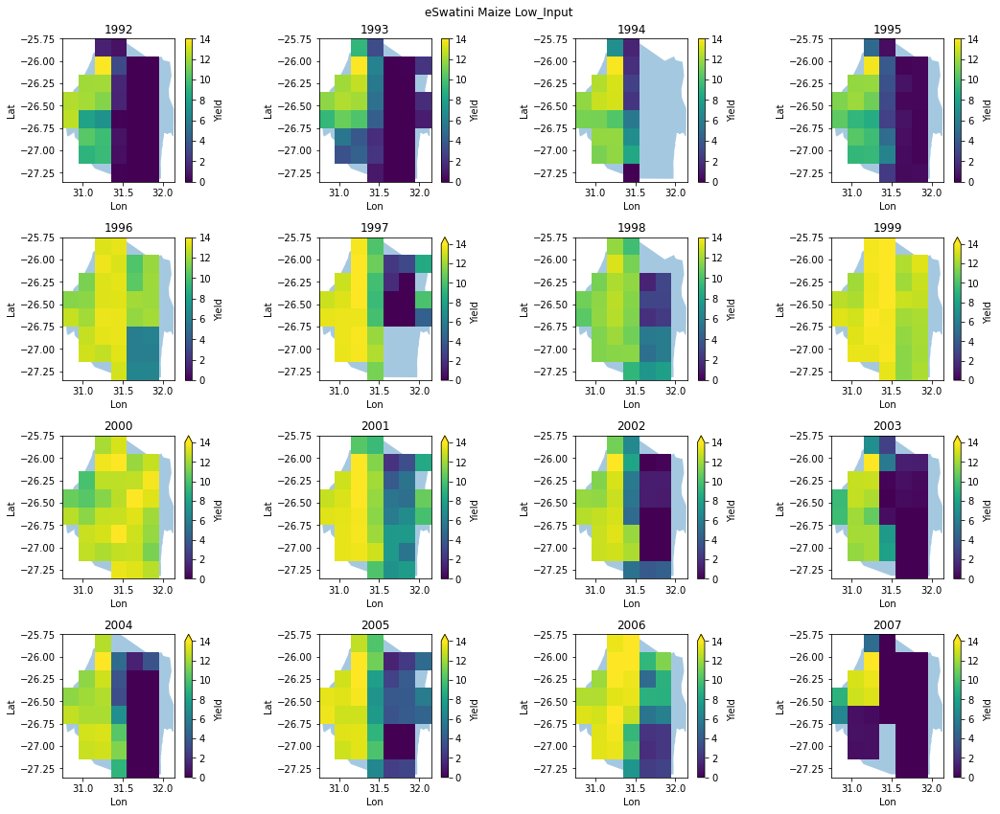

In [86]:
years = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15']

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)


for country in df2.Country.unique():
    bound = boundaries.loc[boundaries['COUNTRY']==country]
    for scene in df2.Scenario.unique():
        for crop in df2['crop Type'].unique():
            dftmp = df2.loc[(df2['Country']==country)&(df2['Scenario']==scene)&(df2['crop Type']==crop)]
            dftmp = dftmp.groupby(['Lat','Lon','Year','Country','Scenario','crop Type']).mean()
            dftmp = dftmp[['Yield (tonne/ha)']].to_xarray()
            dftmp = dftmp.rename_vars({'Yield (tonne/ha)':'Yield'})
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                bound.plot(ax=ax, alpha=0.4)
                dftmp.Yield[:,:,int(year),:,:].plot(ax=ax, vmin=0, vmax=14)
                ax.set_title(int(dftmp.Yield[:,:,int(year),:,:].Year.data))
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            #plt.savefig(os.path.join(DataDir,'Output','Figures','Phase1_{}_{}_{}.png'.format(country, crop, scene)))

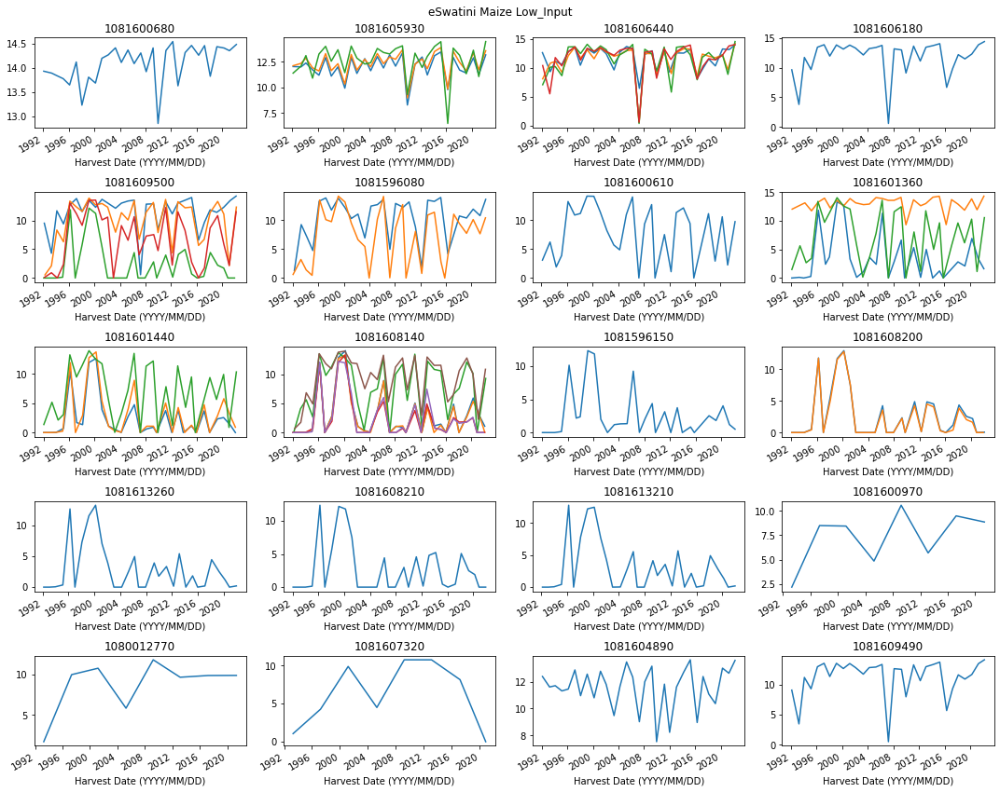

In [87]:
Yields_gdf = gpd.GeoDataFrame(df2, geometry=gpd.points_from_xy(df2.Lon, df2.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

watersheds = gpd.read_file(os.path.join(DataDir,'GIS','combined_wsheds.shp'))
watersheds = watersheds.to_crs(epsg=4326)

watershed_yield = Yields_gdf.sjoin(watersheds, how='left', predicate='within')
watershed_yield['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(watershed_yield['Harvest Date (YYYY/MM/DD)'])

years = watershed_yield.HYBAS_ID.unique()

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)


for country in watershed_yield.Country.unique():
    for scene in watershed_yield.Scenario.unique():
        for crop in watershed_yield['crop Type'].unique():
            dftmp = watershed_yield.loc[(watershed_yield['Country']==country)&(watershed_yield['Scenario']==scene)&(watershed_yield['crop Type']==crop)]
            #dftmp.set_index('Harvest Date (YYYY/MM/DD)', inplace=True)
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                dftmp.loc[dftmp['HYBAS_ID']==year].set_index('Harvest Date (YYYY/MM/DD)').groupby('N_ID')['Yield (tonne/ha)'].plot(ax=ax)
                ax.set_title(year)
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            #plt.savefig(os.path.join(DataDir,'Output','Figures','Phase1_{}_{}_{}.png'.format(country, crop, scene)))

In [135]:
Yields_gdf = gpd.GeoDataFrame(df2, geometry=gpd.points_from_xy(df2.Lon, df2.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

ecozone_yield = Yields_gdf.sjoin(agro_ecozone, how='left', predicate='within')
ecozone_yield['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(ecozone_yield['Harvest Date (YYYY/MM/DD)'])

ecozone_yield.AEZ_NAME.unique()

ecozone_yield['plant_date'] = pd.to_datetime(ecozone_yield['plant_date'])

ecozone_yield['DOY'] = ecozone_yield.plant_date.dt.day_of_year

ecozone_yield['year'] = ecozone_yield.plant_date.dt.year

for i in ['Subtropic - warm / semiarid', 'Tropic - cool / subhumid']:
    dftmp = ecozone_yield.loc[ecozone_yield['AEZ_NAME']==i]
    fig = px.scatter(dftmp, x=dftmp['DOY'], y=dftmp['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66), title='EcoZone {}'.format(i))
    fig.show()
    #fig.write_image(os.path.join(DataDir,'Output','Figures','Indicators','{}_PlantingDateDist.png'.format(id)))

In [138]:
Yields_gdf = gpd.GeoDataFrame(df2, geometry=gpd.points_from_xy(df2.Lon, df2.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

watersheds = gpd.read_file(os.path.join(DataDir,'GIS','combined_wsheds.shp'))
watersheds = watersheds.to_crs(epsg=4326)

watershed_yield = Yields_gdf.sjoin(watersheds, how='left', predicate='within')
watershed_yield['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(watershed_yield['Harvest Date (YYYY/MM/DD)'])


watershed_yield['plant_date'] = pd.to_datetime(watershed_yield['plant_date'])

watershed_yield['DOY'] = watershed_yield.plant_date.dt.day_of_year

watershed_yield['year'] = watershed_yield.plant_date.dt.year

for id in watershed_yield.HYBAS_ID.unique():
    dftmp = watershed_yield.loc[watershed_yield['HYBAS_ID']==id]
    fig = px.scatter(dftmp, x=dftmp['DOY'], y=dftmp['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66), title='Watershed {}'.format(id))
    fig.show()
    fig.write_image(os.path.join(DataDir,'Output','Figures','Indicators','{}_{}_{}_PlantingDateDist.png'.format(id, 'eSwatini','Maize_50Pen')))

### Biomass

In [139]:
Indicators = pd.read_csv(os.path.join(DataDir,'Output','CSVs','Calibration','eSwatini_Baseline_Phase1_CropGrowth_Maize_50Pen_2023-01-30 22:52:45.729144.csv'))

In [147]:
Indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416430 entries, 0 to 416429
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         416430 non-null  int64  
 1   time_step_counter  416430 non-null  float64
 2   season_counter     416430 non-null  float64
 3   dap                416430 non-null  float64
 4   gdd                416430 non-null  float64
 5   gdd_cum            416430 non-null  float64
 6   z_root             416430 non-null  float64
 7   canopy_cover       416430 non-null  float64
 8   canopy_cover_ns    416430 non-null  float64
 9   biomass            416430 non-null  float64
 10  biomass_ns         416430 non-null  float64
 11  harvest_index      416430 non-null  float64
 12  harvest_index_adj  416430 non-null  float64
 13  yield_             416430 non-null  float64
 14  year               416430 non-null  int64  
 15  Lat                416430 non-null  float64
 16  Lo

In [144]:
for year in Indicators.year.unique():
    dftmp = Indicators.loc(Indicators['year'] == year)
    dftmp.set_index('time_step_counter').groupby('N_ID')['biomass'].plot()

TypeError: unhashable type: 'Series'

year
1991    AxesSubplot(0.125,0.125;0.775x0.755)
1992    AxesSubplot(0.125,0.125;0.775x0.755)
1993    AxesSubplot(0.125,0.125;0.775x0.755)
1994    AxesSubplot(0.125,0.125;0.775x0.755)
1995    AxesSubplot(0.125,0.125;0.775x0.755)
1996    AxesSubplot(0.125,0.125;0.775x0.755)
1997    AxesSubplot(0.125,0.125;0.775x0.755)
1998    AxesSubplot(0.125,0.125;0.775x0.755)
1999    AxesSubplot(0.125,0.125;0.775x0.755)
2000    AxesSubplot(0.125,0.125;0.775x0.755)
2001    AxesSubplot(0.125,0.125;0.775x0.755)
2002    AxesSubplot(0.125,0.125;0.775x0.755)
2003    AxesSubplot(0.125,0.125;0.775x0.755)
2004    AxesSubplot(0.125,0.125;0.775x0.755)
2005    AxesSubplot(0.125,0.125;0.775x0.755)
2006    AxesSubplot(0.125,0.125;0.775x0.755)
2007    AxesSubplot(0.125,0.125;0.775x0.755)
2008    AxesSubplot(0.125,0.125;0.775x0.755)
2009    AxesSubplot(0.125,0.125;0.775x0.755)
2010    AxesSubplot(0.125,0.125;0.775x0.755)
2011    AxesSubplot(0.125,0.125;0.775x0.755)
2012    AxesSubplot(0.125,0.125;0.775x0.755)
2013 

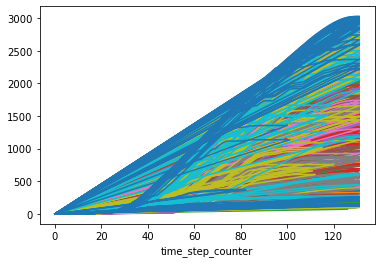

In [151]:
Indicators.set_index('time_step_counter').groupby(['year'])['biomass'].plot()

KeyboardInterrupt: 

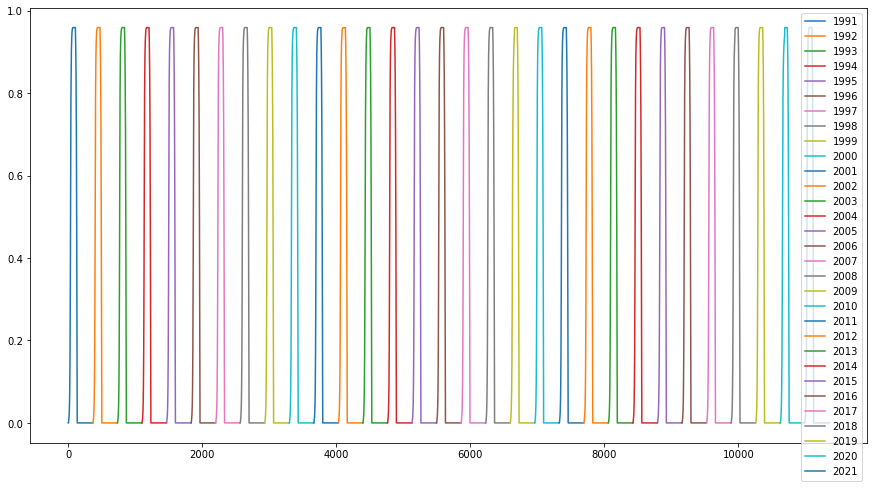

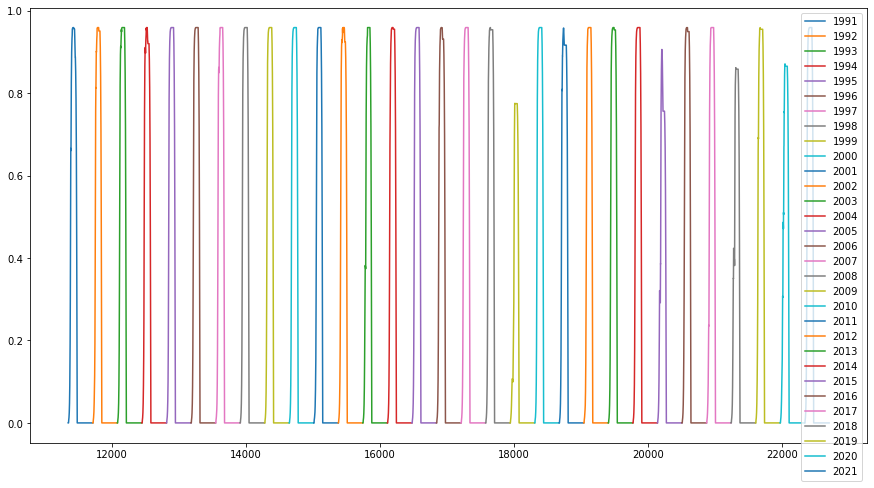

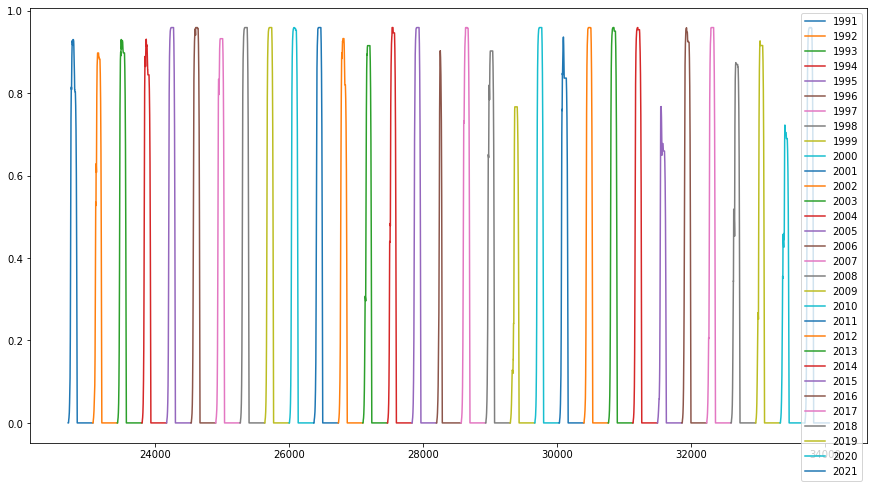

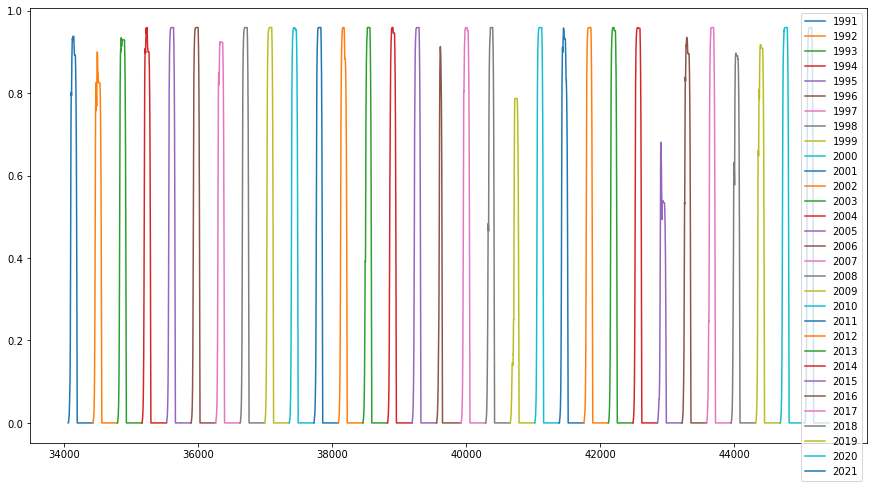

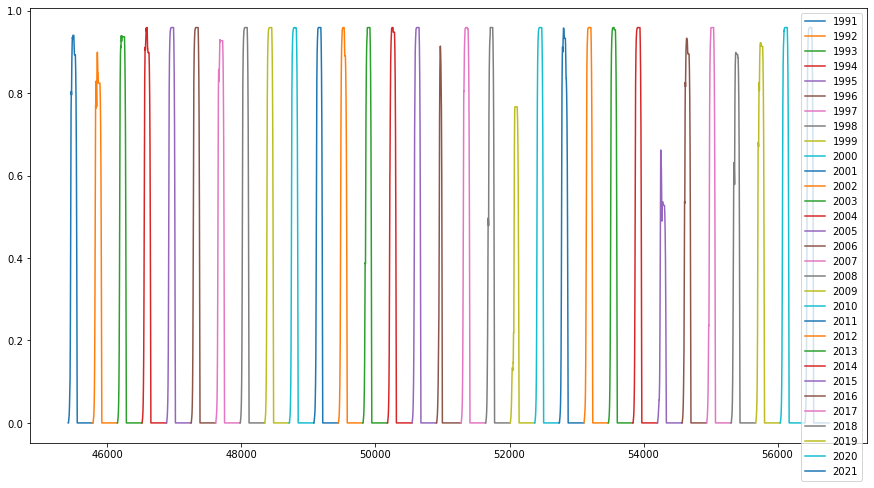

...

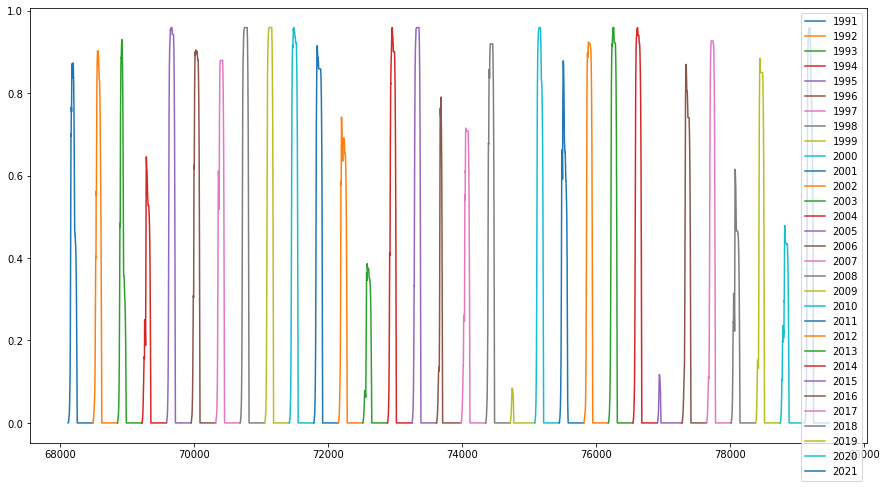

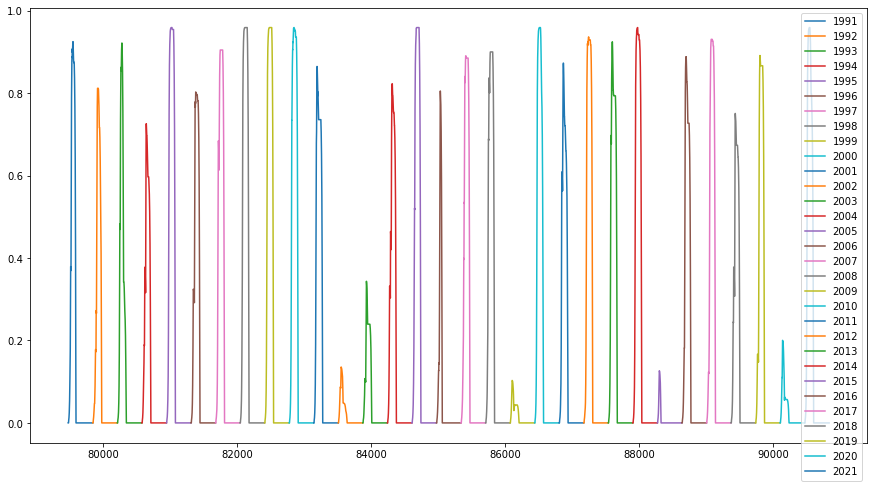

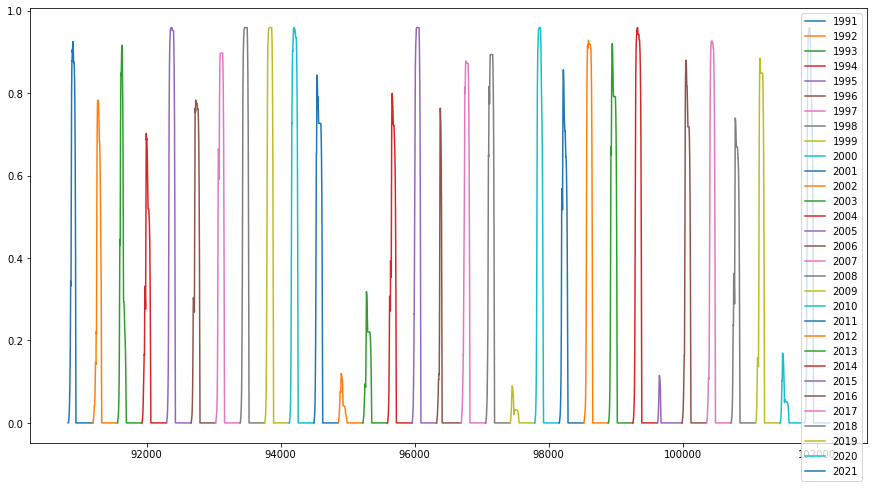

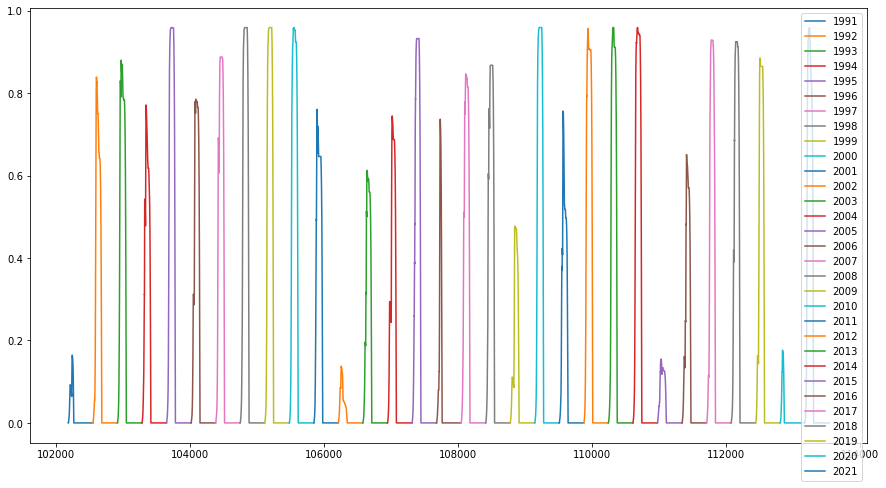

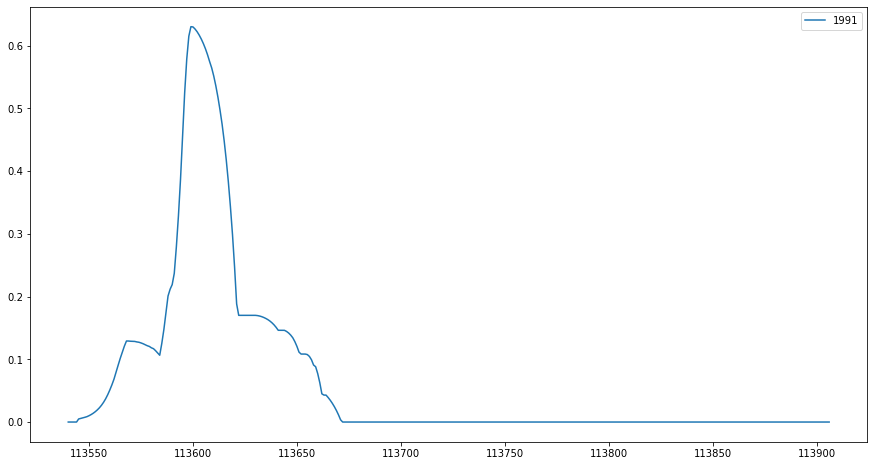

In [140]:
for i in Indicators.ye.unique():
    dftmp = Indicators.loc[Indicators['N_ID']==i]
    fig, ax = plt.subplots(figsize=(15,8))
    #dftmp.groupby('year')[['Wr']].plot(ax=ax, legend=False)
    #dftmp.groupby('year')['TrPot'].sum().plot(ax=ax, legend=True)
    #dftmp.groupby('year')['yield_'].sum().plot(ax=ax, legend=True)
    dftmp.groupby('year')['canopy_cover'].plot(ax=ax, legend=True)
    #plt.savefig('indicators__canopycover_{}.png'.format(i))

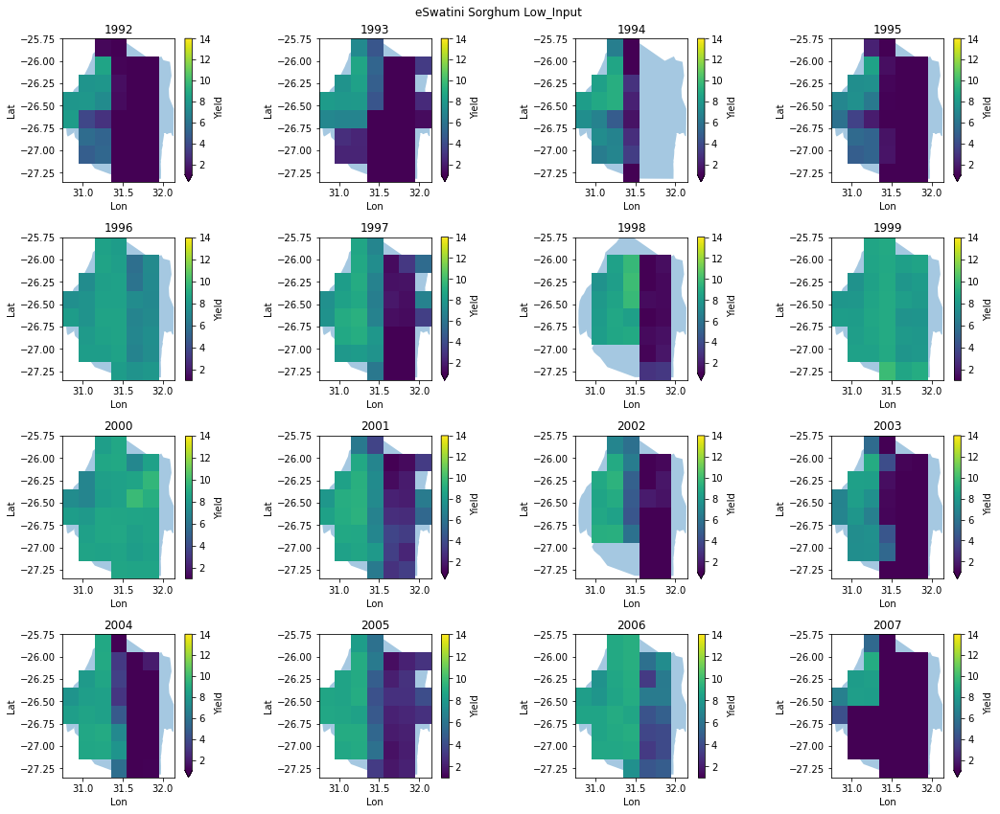

In [18]:
df2 = pd.read_csv(os.path.join(DataDir,'Output','CSVs','Calibration','eSwatini_Baseline_Phase1_Yields_Sorghum_2023-01-30 21:49:50.167873.csv'))
df2['Harvest Date (YYYY/MM/DD)'] = pd.to_datetime(df2['Harvest Date (YYYY/MM/DD)'])
df2['Year'] = df2['Harvest Date (YYYY/MM/DD)'].dt.year

years = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15']

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)


for country in df2.Country.unique():
    bound = boundaries.loc[boundaries['COUNTRY']==country]
    for scene in df2.Scenario.unique():
        for crop in df2['crop Type'].unique():
            dftmp = df2.loc[(df2['Country']==country)&(df2['Scenario']==scene)&(df2['crop Type']==crop)]
            dftmp = dftmp.groupby(['Lat','Lon','Year','Country','Scenario','crop Type']).mean()
            dftmp = dftmp[['Yield (tonne/ha)']].to_xarray()
            dftmp = dftmp.rename_vars({'Yield (tonne/ha)':'Yield'})
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                bound.plot(ax=ax, alpha=0.4)
                dftmp.Yield[:,:,int(year),:,:].plot(ax=ax, vmin=0, vmax=14)
                ax.set_title(int(dftmp.Yield[:,:,int(year),:,:].Year.data))
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            #plt.savefig(os.path.join(DataDir,'Output','Figures','Phase1_{}_{}_{}.png'.format(country, crop, scene)))

In [ ]:
df1 = pd.read_csv(os.path.join(DataDir,'Output','CSVs','Calibration','eSwatini_Baseline_Phase1_Yields_Maize_50Pen_2023-01-30 22:52:49.842608.csv'))
df1.rename(columns={'Yield (tonne/ha)':'100_Pen'}, inplace=True)

# Indicators

In [12]:
os.listdir(os.path.join(DataDir,'Output','CSVs'))

['.ipynb_checkpoints',
 'SADC_Baseline_Phase1_SoilNames_2023-01-10 09:23:21.854064.csv',
 'SADC_Baseline_Phase1_Zambia_2023-01-16 18:49:15.730879.csv',
 'SADC_Baseline_Phase1_2023-01-16 18:59:58.044524.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:01:35.375264.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:02:37.313149.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:03:16.963207.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:03:45.133466.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:07:55.843661.csv',
 'SADC_Baseline_Phase1_2023-01-16 19:15:00.098062.csv',
 'SADC_Baseline_Phase1_2023-01-17 04:56:06.549377.csv',
 'SADC_Baseline_Phase1_SoilNames_2023-01-23.csv',
 'SADC_Baseline_Phase1_WaterFlux_2023-01-23.csv',
 'SADC_Baseline_Phase1_WaterStorage_2023-01-23.csv',
 'SADC_Baseline_Phase1_CropGrowth_2023-01-23.csv',
 'SADC_Baseline_Phase1_Yields_2023-01-23.csv',
 'Calibration']

In [13]:
Yields = pd.read_csv(os.path.join(DataDir,'Output/CSVs/SADC_Baseline_Phase1_Yields_2023-01-23.csv'))

In [14]:
Yields['plant_date'] = pd.to_datetime(Yields['plant_date'])

In [15]:
Yields['DOY'] = Yields.plant_date.dt.day_of_year

In [16]:
Yields['year'] = Yields.plant_date.dt.year

In [18]:
for id in Yields.N_ID.unique():
    dftmp = Yields.loc[Yields['N_ID']==id]
    fig = px.scatter(dftmp, x=dftmp['DOY'], y=dftmp['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66))
    fig.show()

In [19]:
Yields_gdf = gpd.GeoDataFrame(Yields, geometry=gpd.points_from_xy(Yields.Lon, Yields.Lat))
Yields_gdf = Yields_gdf.set_crs(epsg=4326)

In [20]:
watersheds = gpd.read_file(os.path.join(DataDir,'GIS','combined_wsheds.shp'))
watersheds = watersheds.to_crs(epsg=4326)

In [21]:
watershed_yield = Yields_gdf.sjoin(watersheds, how='left', predicate='within' )

In [22]:
watershed_yield

,Unnamed: 0,Season,crop Type,Harvest Date (YYYY/MM/DD),Harvest Date (Step),Yield (tonne/ha),Seasonal irrigation (mm),Lat,Lon,Scenario,...,MAIN_BAS,DIST_SINK,DIST_MAIN,SUB_AREA,UP_AREA,PFAF_ID,ENDO,COAST,ORDER,SORT
0,0,0,Maize,1992-02-10,221,13.933641,0,-26.05,31.25,Low_Input,...,1080012680,436.0,436.0,1069.5,7155.0,12520935,0,0,1,6247
1,0,0,Maize,1993-05-04,221,13.894479,0,-26.05,31.25,Low_Input,...,1080012680,436.0,436.0,1069.5,7155.0,12520935,0,0,1,6247
2,0,0,Maize,1994-02-10,221,13.844806,0,-26.05,31.25,Low_Input,...,1080012680,436.0,436.0,1069.5,7155.0,12520935,0,0,1,6247
3,0,0,Maize,1995-02-24,221,13.779693,0,-26.05,31.25,Low_Input,...,1080012680,436.0,436.0,1069.5,7155.0,12520935,0,0,1,6247
4,0,0,Maize,1996-02-24,221,13.650552,0,-26.05,31.25,Low_Input,...,1080012680,436.0,436.0,1069.5,7155.0,12520935,0,0,1,6247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1204,0,0,Maize,2018-02-10,221,13.585223,0,-26.25,31.25,Low_Input,...,1080012750,106.1,106.1,1251.0,1251.0,12530069,0,0,1,6274
1205,0,0,Maize,2019-02-24,221,14.245975,0,-26.25,31.25,Low_Input,...,1080012750,106.1,106.1,1251.0,1251.0,12530069,0,0,1,6274
1206,0,0,Maize,2020-04-06,221,14.351866,0,-26.25,31.25,Low_Input,...,1080012750,106.1,106.1,1251.0,1251.0,12530069,0,0,1,6274
1207,0,0,Maize,2021-02-09,221,14.260470,0,-26.25,31.25,Low_Input,...,1080012750,106.1,106.1,1251.0,1251.0,12530069,0,0,1,6274


<AxesSubplot: >

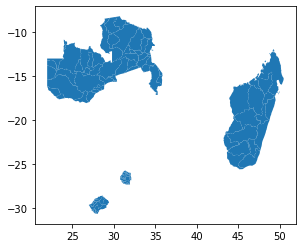

In [23]:
watersheds.plot()

<AxesSubplot: >

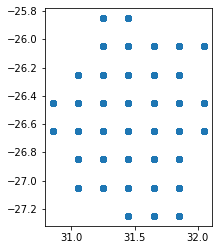

In [24]:
Yields_gdf.plot()

In [25]:
for id in watershed_yield.HYBAS_ID.unique():
    dftmp = watershed_yield.loc[watershed_yield['HYBAS_ID']==id]
    fig = px.scatter(dftmp, x=dftmp['DOY'], y=dftmp['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66), title='Watershed {}'.format(id))
    fig.show()
    fig.write_image(os.path.join(DataDir,'Output','Figures','Indicators','{}_PlantingDateDist.png'.format(id)))

<AxesSubplot: ylabel='Frequency'>

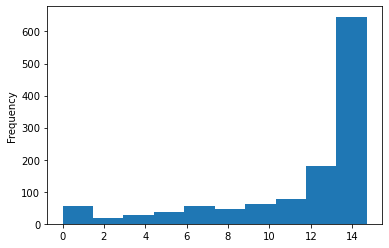

In [26]:
Yields.set_index('Harvest Date (YYYY/MM/DD)')['Yield (tonne/ha)'].plot(kind='hist')

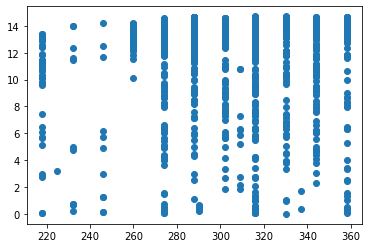

In [27]:
plt.scatter(x=Yields['DOY'], y=Yields['Yield (tonne/ha)'])

In [28]:
import plotly.express as px

In [29]:
px.scatter(Yields, x=Yields['DOY'], y=Yields['Yield (tonne/ha)'] ,color='year',trendline='lowess', trendline_options=dict(frac=0.66))

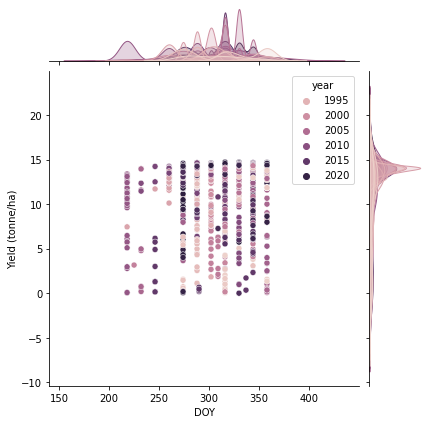

In [30]:
ax = sns.jointplot(x='DOY', y='Yield (tonne/ha)', data = Yields, hue='year')

In [31]:
WaterFlux = pd.read_csv(os.path.join(DataDir,'Output','CSVs','SADC_Baseline_Phase1_WaterFlux_2023-01-23.csv'))
WaterFlux.drop(columns={'Unnamed: 0'}, inplace=True)
WaterFlux.set_index('time_step_counter', inplace=True)

In [32]:
WaterFlux.columns

Index(['season_counter', 'dap', 'Wr', 'z_gw', 'surface_storage', 'IrrDay',
       'Infl', 'Runoff', 'DeepPerc', 'CR', 'GwIn', 'Es', 'EsPot', 'Tr',
       'TrPot', 'year', 'Lat', 'Lon', 'N_ID'],
      dtype='object')

In [ ]:
%matplotlib inline

IndexError: pop from empty list

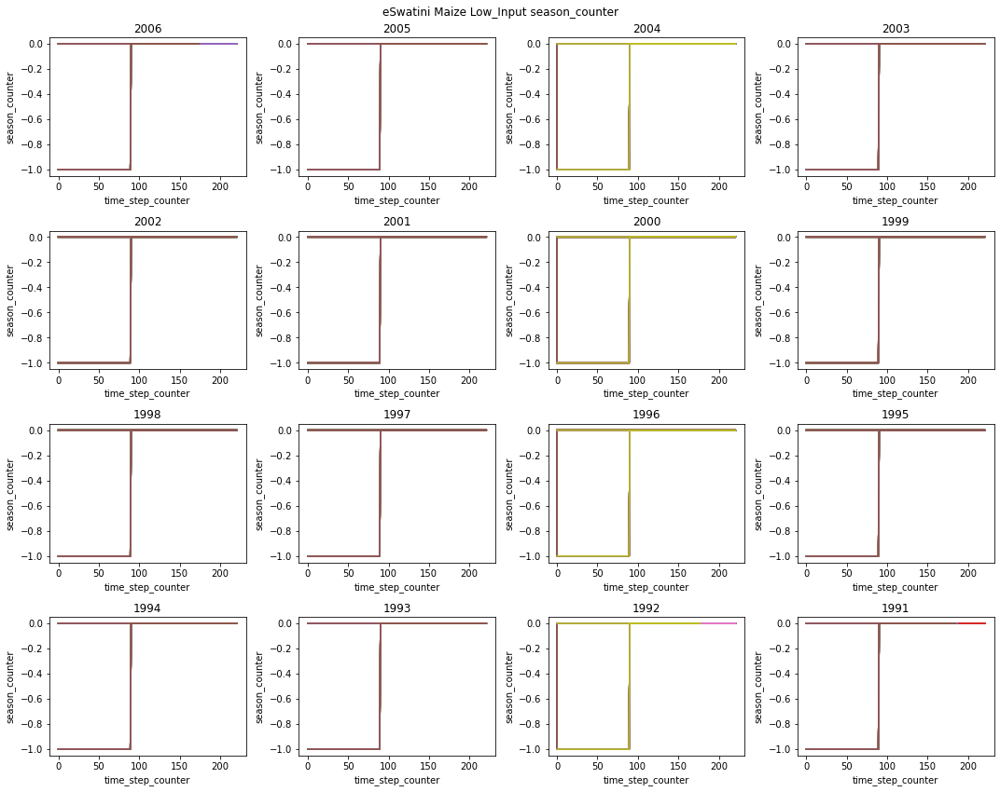

In [ ]:
for var in WaterFlux.columns:
    # set number of columns (use 3 to demonstrate the change)
    ncols = 4
    # calculate number of rows
    nrows = len(years) // ncols + (len(years) % ncols > 0)
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
    axes_list = [item for sublist in ax for item in sublist]
    for year in [year for year in WaterFlux.year.unique() if not np.isnan(year)]:
        ax = axes_list
        dftmp = WaterFlux.loc[WaterFlux['year']==year]
        dftmp.groupby('N_ID')[var].plot(ax=ax)
        ax.set_title(year)
        ax.set_ylabel(var)
        plt.suptitle('{} {} {} {}'.format(country, crop, scene, var))
        plt.tight_layout()
        #plt.savefig('Data/Output/Figures/Indicators/{}_{}_{}_{}.png'.format(country, crop, scene, var))
    plt.close()

In [ ]:
files = ['SADC_Baseline_Phase1_SoilNames_2023-01-23.csv',
 'SADC_Baseline_Phase1_WaterFlux_2023-01-23.csv',
 'SADC_Baseline_Phase1_WaterStorage_2023-01-23.csv',
 'SADC_Baseline_Phase1_CropGrowth_2023-01-23.csv']

Indicators = pd.DataFrame()
for file in files:
    dftmp = pd.read_csv(os.path.join(DataDir,'Output','CSVs',file))
    dftmp.set_index(['Lat','Lon'], inplace=True)
    dftmp.drop(columns={'Unnamed: 0'}, inplace=True)
    if len(Indicators) == 0:
        Indicators = dftmp
    else:
        Indicators = pd.concat([Indicators, dftmp], axis=0)

In [ ]:
Indicators.columns

Index(['Season', 'crop Type', 'Harvest Date (YYYY/MM/DD)',
       'Harvest Date (Step)', 'Yield (tonne/ha)', 'Seasonal irrigation (mm)',
       'Scenario', 'Country', 'time_step_counter', 'season_counter', 'dap',
       'Wr', 'z_gw', 'surface_storage', 'IrrDay', 'Infl', 'Runoff', 'DeepPerc',
       'CR', 'GwIn', 'Es', 'EsPot', 'Tr', 'TrPot', 'year', 'N_ID',
       'growing_season', 'th1', 'th2', 'th3', 'th4', 'th5', 'th6', 'th7',
       'th8', 'th9', 'th10', 'th11', 'th12', 'gdd', 'gdd_cum', 'z_root',
       'canopy_cover', 'canopy_cover_ns', 'biomass', 'biomass_ns',
       'harvest_index', 'harvest_index_adj', 'yield_'],
      dtype='object')

In [ ]:
Indicators.set_index('time_step_counter', inplace=True)

IndexError: pop from empty list

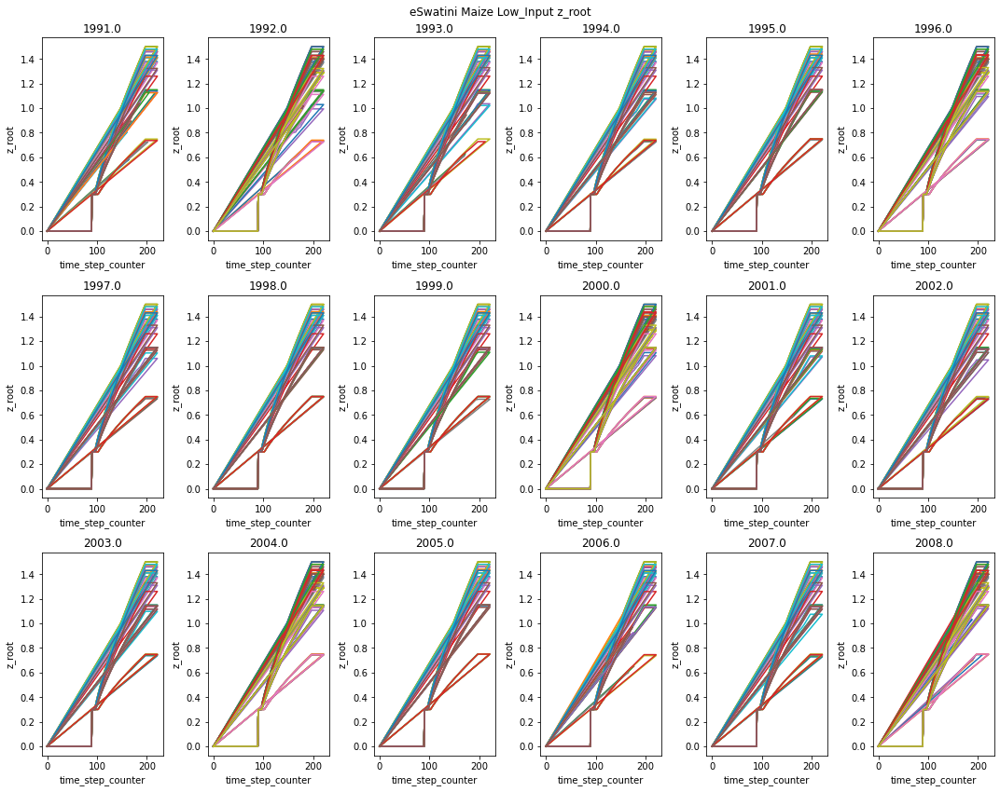

In [ ]:
# set number of columns (use 3 to demonstrate the change)
ncols = 6
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))

axes_list = [item for sublist in ax for item in sublist]

for var in ['z_root']:
    for year in [year for year in Indicators.year.unique() if not np.isnan(year)]:
        ax = axes_list.pop(0)
        dftmp = Indicators.loc[Indicators['year']==year]
        dftmp.groupby('N_ID')[var].plot(ax=ax)
        ax.set_title(year)
        ax.set_ylabel(var)
        plt.suptitle('{} {} {} {}'.format(country, crop, scene, var))
        plt.tight_layout()
        plt.savefig('Data/Output/Figures/Indicators/{}_{}_{}_{}.png'.format(country, crop, scene, var))

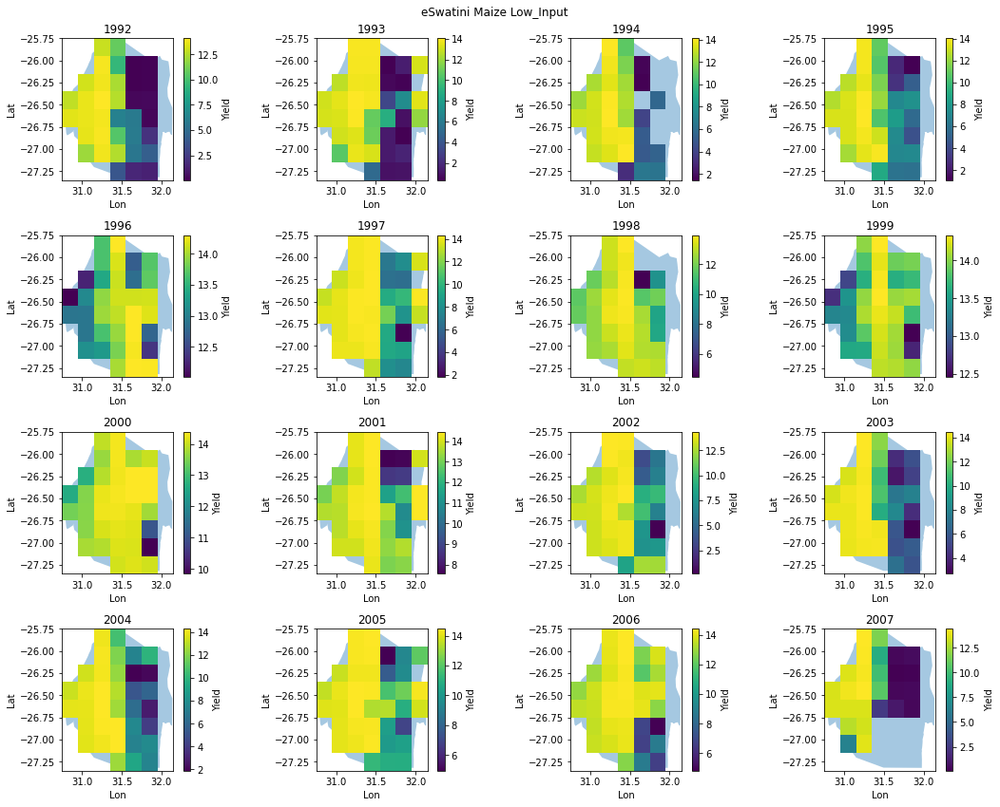

In [ ]:
years = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15']

# set number of columns (use 3 to demonstrate the change)
ncols = 4
# calculate number of rows
nrows = len(years) // ncols + (len(years) % ncols > 0)

for scene in test.Scenario.unique():
    for crop in test['crop Type'].unique():
            dftmp = test.loc[(test['Country']==country)&(test['Scenario']==scene)&(test['crop Type']==crop)]
            dftmp = dftmp.groupby(['Lat','Lon','Year','Country','Scenario','crop Type']).mean()
            dftmp = dftmp[['Yield (tonne/ha)']].to_xarray()
            dftmp = dftmp.rename_vars({'Yield (tonne/ha)':'Yield'})
            fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,12))
            axes_list = [item for sublist in ax for item in sublist]
            for year in years:
                ax = axes_list.pop(0)
                bound.plot(ax=ax, alpha=0.4)
                dftmp.Yield[:,:,int(year),:,:].plot(ax=ax)
                ax.set_title(int(dftmp.Yield[:,:,int(year),:,:].Year.data))
            plt.suptitle('{} {} {}'.format(country, crop, scene))
            plt.tight_layout()
            plt.savefig(os.path.join(DataDir,'Output','Figures','Indicators','{}_{}_{}_Yield.png'.format(country, crop, scene)))